In [2]:
import os
import h5py
import numpy as np
from scipy.integrate import solve_ivp

# File paths
old_file_path = "C:/Users/arnab/OneDrive/Desktop/Study material/summer 24/Research/Old equations/datasets/trials_many_alldata_v3.h5"
new_file_path = "C:/Users/arnab/OneDrive/Desktop/Study material/summer 24/Research/New equations/datasets/trials_many_alldata_new_eqution2.h5"

# Ensure the directory exists
new_dir = os.path.dirname(new_file_path)
os.makedirs(new_dir, exist_ok=True)

# Constants
P_c = 0.0653
phi = 0.279
h_e_range = (0.5, 1)

# Function to calculate I
def calculate_I(h, f, I_0=1.0):
    return I_0 * (1 - np.exp(-phi * h * f)) / (1 + f ** 2)

# Differential equation system
def differential_system(t, y, J_e, b_1, b_2, h_e):
    h, c = y
    g_t = b_1 * np.exp(b_2 * t)
    dh_dt = -g_t * h - J_e * (1 - (h_e / h) ** 3) + P_c * (c-1)
    dc_dt = (J_e * (1 - (h_e / h) ** 3) - P_c * (c - 1)) * c / h
    return [dh_dt, dc_dt]

# Main function
def generate_dataset():
    with h5py.File(old_file_path, 'r') as old_data, h5py.File(new_file_path, 'w') as new_data:
        # Extract parameter values
        P_old = old_data['P'][:]
        J_e_values = P_old[:, 0]
        b_1_values = P_old[:, 1]
        b_2_values = P_old[:, 2]
        f_0_primes = P_old[:, 6]
        f_cr = 5.3e-3
        f_0_values = f_0_primes/f_cr
        h_0_values = P_old[:, 4]
        time_grid = np.linspace(0, 1, 601)

        # Create datasets in the new file
        new_h = new_data.create_dataset("h", (0, len(time_grid)), maxshape=(None, len(time_grid)))
        new_c = new_data.create_dataset("c", (0, len(time_grid)), maxshape=(None, len(time_grid)))
        new_f = new_data.create_dataset("f", (0, len(time_grid)), maxshape=(None, len(time_grid)))
        new_I = new_data.create_dataset("I", (0, len(time_grid)), maxshape=(None, len(time_grid)))
        new_P = new_data.create_dataset("P", (0, P_old.shape[1] + 1), maxshape=(None, P_old.shape[1] + 1))

        # Iterate over parameter sets
        count = 0
        accepeted_parameter = 0
        accepeted_parameter_index = []
        rejected_parameter = 0
        rejected_parameter_index = []
        
        for i, (J_e, b_1, b_2, f_0, h_0) in enumerate(zip(J_e_values, b_1_values, b_2_values, f_0_values, h_0_values)):
            while count < 50:
                # Randomly choose h_e
                h_e_prime = np.random.uniform(*h_e_range)
                h_e = h_e_prime/h_0

                # Solve the differential equations
                y0 = [1, 1]
                sol = solve_ivp(
                    differential_system,
                    [time_grid[0], time_grid[-1]],
                    y0,
                    t_eval=time_grid,
                    args=(J_e, b_1, b_2, h_e),
                    method='RK45'
                )

                h, c = sol.y
                f = f_0 * c
                I = calculate_I(h, f)

                # Check acceptability
                if np.all(h <= 1.1):
                    # Data is acceptable, save it
                    new_h.resize(new_h.shape[0] + 1, axis=0)
                    new_c.resize(new_c.shape[0] + 1, axis=0)
                    new_f.resize(new_f.shape[0] + 1, axis=0)
                    new_I.resize(new_I.shape[0] + 1, axis=0)
                    new_P.resize(new_P.shape[0] + 1, axis=0)

                    new_h[-1] = h
                    new_c[-1] = c
                    new_f[-1] = f
                    new_I[-1] = I

                    # Append parameter values including h_e
                    new_P[-1] = np.append(P_old[i], h_e)
                    accepeted_parameter += 1
                    accepeted_parameter_index.append(i)
                    print(f"{h_e} is accepted")
                    count = 0
                    break
                else:
                    count += 1
            if count == 50:
                print("Suitable h_e was not found")
                rejected_parameter += 1
                rejected_parameter_index.append(i)
                count = 0

            print(f"Processed parameter set {i + 1}/{len(J_e_values)}, {accepeted_parameter} parameters has been accepted.")

    print(f"Dataset generation completed and saved to: {new_file_path}, accepted parameters = {accepeted_parameter}, rejected parameters = {rejected_parameter}")
    
    return accepeted_parameter, accepeted_parameter_index, rejected_parameter, rejected_parameter_index

# Run the function
accepeted_parameter, accepeted_parameter_index, rejected_parameter, rejected_parameter_index = generate_dataset()


0.28613540455256137 is accepted
Processed parameter set 1/111563, 1 parameters has been accepted.
0.12331437423099229 is accepted
Processed parameter set 2/111563, 2 parameters has been accepted.
0.8463929772539988 is accepted
Processed parameter set 3/111563, 3 parameters has been accepted.
0.12514758101812212 is accepted
Processed parameter set 4/111563, 4 parameters has been accepted.
0.2431797485299706 is accepted
Processed parameter set 5/111563, 5 parameters has been accepted.
1.0112590873806204 is accepted
Processed parameter set 6/111563, 6 parameters has been accepted.
0.20953370483197892 is accepted
Processed parameter set 7/111563, 7 parameters has been accepted.
0.3618332212538623 is accepted
Processed parameter set 8/111563, 8 parameters has been accepted.
0.1528652661681019 is accepted
Processed parameter set 9/111563, 9 parameters has been accepted.
0.4383484410119366 is accepted
Processed parameter set 10/111563, 10 parameters has been accepted.
0.10582252269132772 is a

In [3]:
import torch
import os
import h5py
import numpy as np
from scipy.integrate import solve_ivp

In [4]:
datastore = h5py.File("C:/Users/arnab/OneDrive/Desktop/Study material/summer 24/Research/New equations/datasets/trials_many_alldata_new_eqution2.h5", 'r')
data_I = np.array(datastore["I"])
data_h = np.array(datastore["h"])
data_f = np.array(datastore["f"])

data_c = np.array(datastore["c"])

device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
# device = "cpu"
print(f"Using {device} device")

Using cpu device


In [5]:
import matplotlib.pyplot as plt

In [6]:
t = np.linspace(0,1,601)

76437


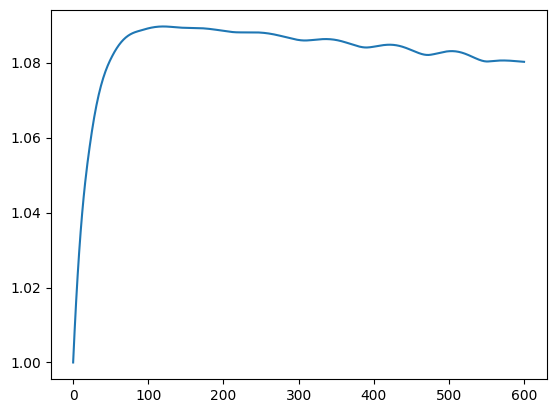

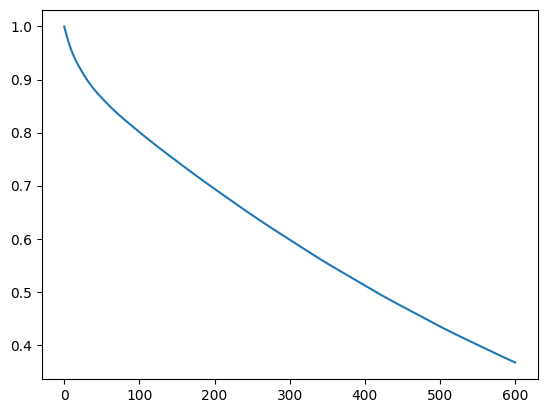

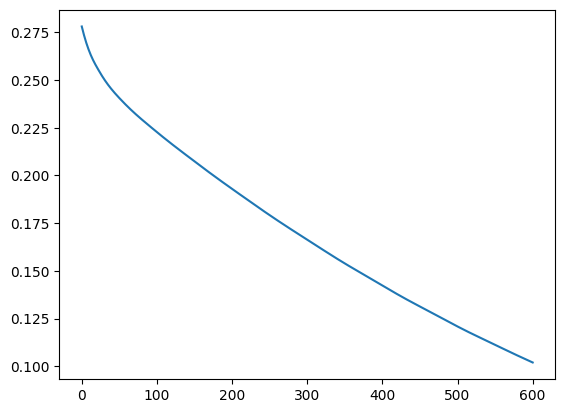

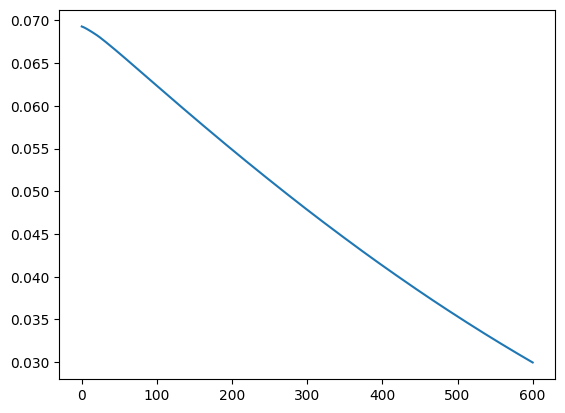

In [9]:
n = np.random.randint(0, 111563)
print(n)
plt.plot(data_h[n])
plt.show()
plt.plot(data_c[n])
plt.show()
plt.plot(data_f[n])
plt.show()
plt.plot(data_I[n])
plt.show()

72742


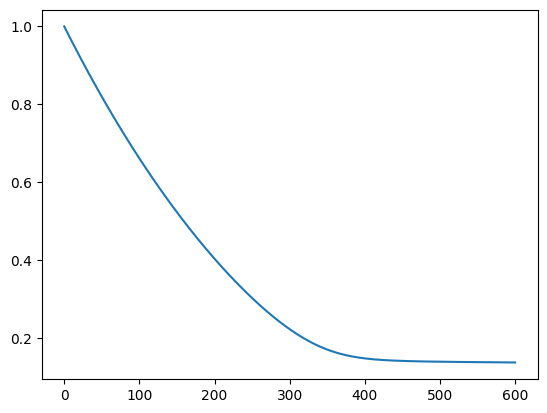

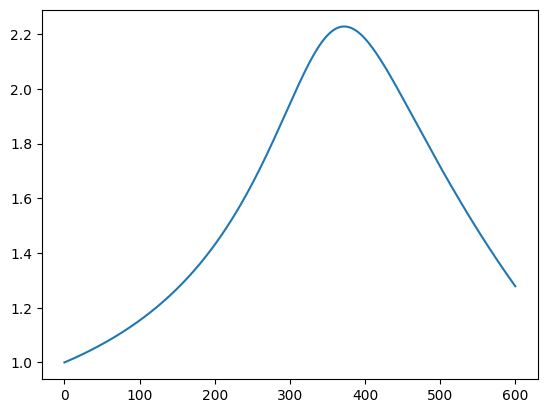

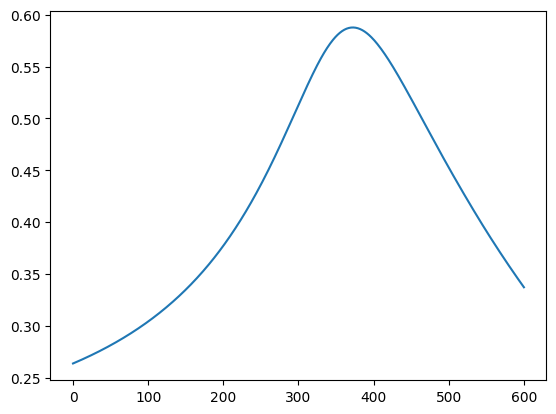

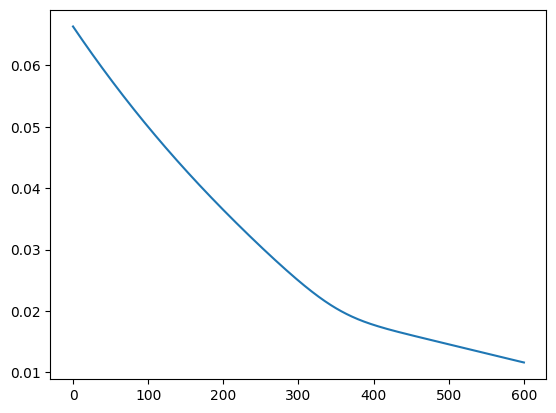

In [12]:
n = np.random.randint(0, 111563)
print(n)
plt.plot(data_h[n])
plt.show()
plt.plot(data_c[n])
plt.show()
plt.plot(data_f[n])
plt.show()
plt.plot(data_I[n])
plt.show()

10984


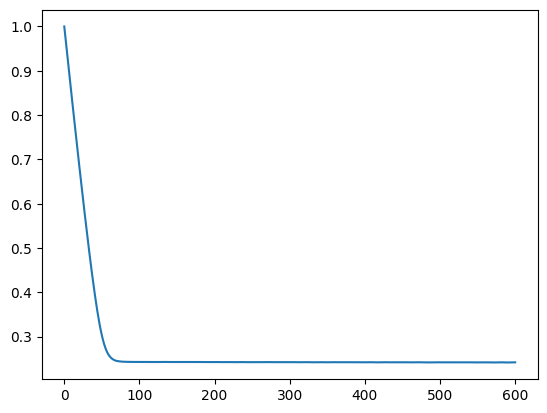

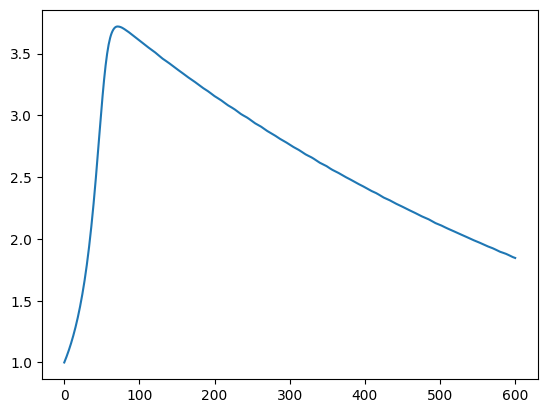

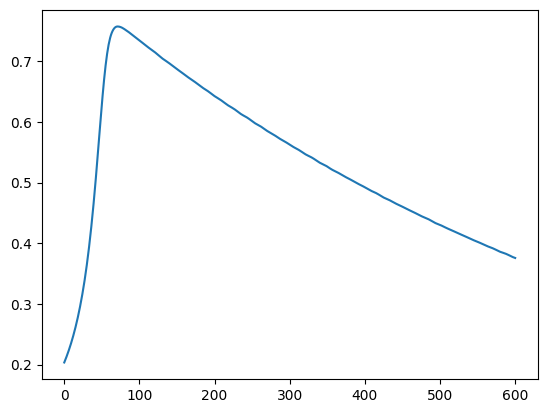

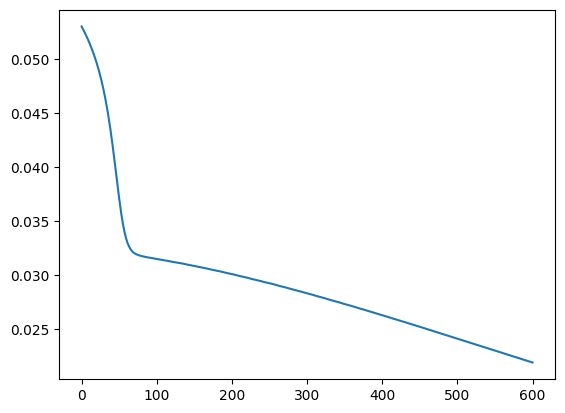

In [13]:
n = np.random.randint(0, 111563)
print(n)
plt.plot(data_h[n])
plt.show()
plt.plot(data_c[n])
plt.show()
plt.plot(data_f[n])
plt.show()
plt.plot(data_I[n])
plt.show()